# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [9]:
# run this once to unzip the file
# !unzip processed-celeba-small.zip 

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

In [233]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Lambda
from torchvision.datasets import ImageFolder

import torchvision.transforms as T

import tests

In [234]:
#data_dir = 'processed_celeba_small/celeba/'
#data_dir = 'processed_celeba_small/'

data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [235]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appending transforms to the below list
    
    
    transforms = [ToTensor()]
    
    transforms.append(Resize(size))
    lambdafunction = Lambda(lambda x : -1+ 2*x ) # rescale from [0,1] to [-1,1]
    transforms.append(lambdafunction)
    return Compose(transforms)

z = get_transforms((64,64))
print(z)

Compose(
    ToTensor()
    Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=None)
    Lambda()
)


### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [236]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        # TODO: implement the init method
        self.dataset = ImageFolder(self.directory, transform=self.transforms)

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        #dataset = ImageFolder(self.directory, transform=self.transforms)
        length = len(self.dataset)
        #print('length is equal to {}'.format(length))
        
        return length

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
      
        one_single_image, _ = self.dataset[index]
       
        
        return one_single_image

In [237]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
print(dataset[1].size())
print(dataset[1])
print(dataset[2])

tests.check_dataset_outputs(dataset)

torch.Size([3, 64, 64])
tensor([[[-0.5922, -0.5765, -0.5843,  ..., -0.0510, -0.1059, -0.1608],
         [-0.5451, -0.5843, -0.6000,  ..., -0.0824, -0.2078, -0.2863],
         [-0.5529, -0.5608, -0.5451,  ..., -0.1843, -0.2392, -0.3255],
         ...,
         [ 0.8824,  0.8902,  0.9059,  ...,  0.1059, -0.4667, -0.8039],
         [ 0.8902,  0.8980,  0.9059,  ..., -0.0275, -0.5608, -0.8196],
         [ 0.8980,  0.9059,  0.9137,  ..., -0.1059, -0.6078, -0.8275]],

        [[-0.7333, -0.6941, -0.6941,  ..., -0.5137, -0.5373, -0.5765],
         [-0.6627, -0.6941, -0.6863,  ..., -0.5608, -0.6627, -0.7020],
         [-0.6627, -0.6471, -0.6157,  ..., -0.6627, -0.6941, -0.7412],
         ...,
         [ 0.8824,  0.9059,  0.9216,  ..., -0.0745, -0.6157, -0.9216],
         [ 0.8902,  0.9137,  0.9216,  ..., -0.2235, -0.7098, -0.9373],
         [ 0.8980,  0.9216,  0.9294,  ..., -0.3020, -0.7569, -0.9529]],

        [[-0.7490, -0.7176, -0.7176,  ..., -0.5451, -0.5608, -0.6078],
         [-0.6863, -0

The functions below will help you visualize images from the dataset.

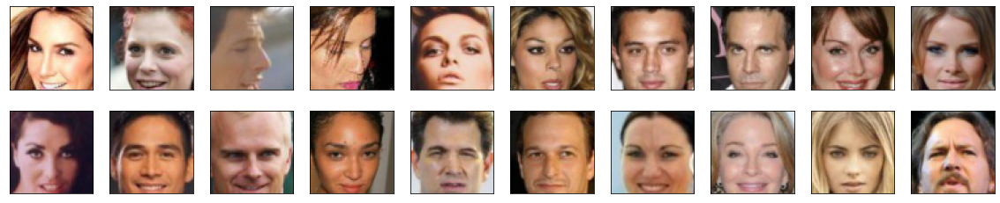

In [238]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [239]:
from torch.nn import Module

In [240]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        
        # No batchnormalization since I will try to use the Wasserstein loss with gradient penalty
        
        self.conv1 = nn.Conv2d(3,32,2,stride= (2,2)) #output shape = batchsizex32x32x32
        
        self.conv2 = nn.Conv2d(32,64,2,stride = (2,2)) #output shape = batchsizex64x16x16
        self.bn2 = nn.BatchNorm2d(64)
        
        self.conv3 = nn.Conv2d(64,128,2,stride = (2,2)) # output shape = batchsizex128x8x8
        self.bn3 = nn.BatchNorm2d(128)
    
        
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(128*8*8,1)
        
        #self.sigmoid = nn.Sigmoid()
        
        self.activation = nn.LeakyReLU(0.2)
        
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.conv1(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.activation(x)
        
        
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.activation(x)
        
        
        x = self.flatten(x)
        x = self.fc(x)
        
        #x = self.sigmoid(x) Sigmoid activation function integrated in BCELogitsLoss !
        return x 
    
   

In [241]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

torch.Size([1, 1])
Congrats, your discriminator implementation passed all the tests


In [242]:
discriminator = Discriminator()
testtensor = torch.rand(32,3,64,64)
output = discriminator(testtensor)
print(output)

tensor([[-0.2902],
        [-0.1148],
        [ 0.0154],
        [ 0.1000],
        [-0.0754],
        [-0.1757],
        [ 0.2736],
        [-0.2801],
        [-0.7656],
        [-0.7137],
        [-0.5088],
        [ 0.1537],
        [-0.5304],
        [ 0.2379],
        [-1.5587],
        [-0.0051],
        [ 0.1628],
        [-0.1042],
        [ 0.4783],
        [-0.0369],
        [ 0.4119],
        [-0.1972],
        [-0.0209],
        [-0.3800],
        [-0.2259],
        [ 0.0296],
        [ 1.0106],
        [ 0.0879],
        [-0.2988],
        [-0.1897],
        [ 0.1490],
        [-0.2539]], grad_fn=<AddmmBackward0>)


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [243]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        
        self.activation = nn.ReLU()
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(latent_dim,2048)
        
        # TODO: instantiate the different layers
        self.deconv1 = nn.ConvTranspose2d(2048,512,(4,4))
        #self.deconv1 = nn.ConvTranspose2d(256,512,(4,4))
        self.bn1 = nn.BatchNorm2d(512)
        #self.activation = nn.ReLU()
        #self.fc = nn.Linear(latent_dim, 256)
      
        self.deconv2 = nn.ConvTranspose2d(512,256, (4,4),stride = 2, padding = 1)
        self.bn2 = nn.BatchNorm2d(256)
        #self.activation = nn.ReLU()
        
        self.deconv3 = nn.ConvTranspose2d(256,128,(4,4),stride = 2,padding = 1)
        self.bn3 = nn.BatchNorm2d(128)
        #self.activation = nn.ReLU()
        
        self.deconv4 = nn.ConvTranspose2d(128,64,(4,4),stride = 2,padding = 1)
        self.bn4 = nn.BatchNorm2d(64)
        #self.activation = nn.ReLU()
        
        self.deconv5 = nn.ConvTranspose2d(64,3,(4,4),stride = 2,padding = 1)
       
        self.activation_final = nn.Tanh()     
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        
        x = self.flatten(x)
        x = self.fc(x)
        x = x.unsqueeze(2)
        x = x.unsqueeze(3)
        
        #x = x.unsqueeze(1)
        
        x = self.deconv1(x)
        x = self.bn1(x)
        x = self.activation(x)
       
        
        
        x = self.deconv2(x)
        x = self.bn2(x)
        x = self.activation(x)
       

        x = self.deconv3(x)
        x = self.bn3(x)
        x = self.activation(x)
        
    
          
        x = self.deconv4(x)
       
        
        x = self.deconv5(x)
        x = self.activation_final(x)
        
       
        
        return x

In [244]:
generator = Generator(128)
x = torch.rand(32,128,1,1)
output = generator(x)
print(output.shape)
print(output)

torch.Size([32, 3, 64, 64])
tensor([[[[ 4.5905e-02,  8.4481e-02,  8.3639e-02,  ..., -4.6673e-02,
           -7.1388e-02,  5.3827e-02],
          [ 5.3854e-02,  2.7003e-01, -7.2713e-02,  ...,  3.2540e-02,
           -6.1823e-02, -1.1951e-01],
          [-2.2534e-02, -1.2182e-01,  1.5584e-01,  ...,  5.6135e-02,
           -1.0138e-01, -1.4291e-01],
          ...,
          [-7.8388e-02, -2.2250e-01,  5.5182e-02,  ...,  1.0002e-02,
           -1.3485e-01, -2.6992e-02],
          [ 1.0119e-02,  2.5364e-01,  1.4124e-01,  ...,  6.1396e-02,
           -2.2968e-01, -2.9460e-02],
          [ 1.4368e-02, -1.1378e-01,  1.1719e-02,  ..., -1.1259e-01,
           -1.1371e-02, -1.3169e-02]],

         [[ 3.8264e-02,  1.7174e-02,  6.5508e-03,  ...,  2.3574e-02,
           -3.5024e-02,  3.7335e-02],
          [-6.9779e-02, -2.5474e-01, -1.2127e-01,  ..., -1.4179e-01,
           -1.2253e-01,  7.3090e-02],
          [ 5.4714e-02,  2.9426e-01,  1.7499e-01,  ...,  9.8964e-02,
            1.2027e-01, -3.865

In [245]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [246]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr_g = 0.0002
    lr_d = 0.0003 #Slightly higher lr for TTUR
    beta1 = 0.5
    beta2 = 0.999
    g_optimizer = optim.Adam(generator.parameters(),lr_g, [beta1,beta2])
    d_optimizer = optim.Adam(discriminator.parameters(),lr_d, [beta1,beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [247]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 

    criterion = nn.BCEWithLogitsLoss()
    labels = torch.ones(batch_size).to(device)
    
   
    fake_loss = criterion(fake_logits,labels)
    
    

    
    return fake_loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [248]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    criterion = nn.BCEWithLogitsLoss()
    
    batch_size = real_logits.size(0)
    labels_real = torch.ones(batch_size).to(device)*0.9
    
    d_real_loss = criterion(real_logits.squeeze(),labels_real)
    
    labels_fake = torch.zeros(batch_size).to(device)
    
    d_fake_loss = criterion(fake_logits.squeeze(),labels_fake)
    
    loss = d_real_loss + d_fake_loss 
   
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [249]:

# This function will not be called in the project since I abandoned to try to implement Wasserstein

def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    
    alpha = torch.rand(real_samples.shape).to(device)
    lambd_a = 10
    x_hat = alpha * real_samples + (1-alpha)*fake_samples
    #x_hat.cuda()
    #x_hat.requires_grad = True
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, x_hat, grad_outputs = torch.ones_like(pred),create_graph = True, retain_graph=True)[0]
    #norm = torch.norm(grad.view(-1),2)
    
    gradients = grad.view(batch_size, -1)
    gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)
    
    #gp = lambd_a*((norm -1)**2).mean().to(device)
    gp = lambd_a * ((gradients_norm - 1) ** 2).mean().to(device)

    
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [250]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    
    g_optimizer.zero_grad()
    g_loss = generator_loss(fake_logits)
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [251]:
from datetime import datetime

In [252]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 50

# number of images in each batch
batch_size = 100

In [253]:
# test (source: github)


def weights_init_normal(m):
    """
    Applies initial weights to certain layers in a model .
    The weights are taken from a normal distribution 
    with mean = 0, std dev = 0.02.
    :param m: A module or layer in a network    
    """
    # classname will be something like:
    # `Conv`, `BatchNorm2d`, `Linear`, etc.
    classname = m.__class__.__name__
    
    # TODO: Apply initial weights to convolutional and linear layers
    if hasattr(m, 'weight') and ((classname.find('Conv') != -1) or (classname.find('Linear') != -1)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

In [254]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

dataloader = DataLoader(dataset, 
                        batch_size=batch_size, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [255]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2022-12-29 10:45:42 | Epoch [1/50] | Batch 0/573 | d_loss: 1.9302 | g_loss: 1.8918
2022-12-29 10:46:02 | Epoch [1/50] | Batch 50/573 | d_loss: 0.3407 | g_loss: 7.1391
2022-12-29 10:46:22 | Epoch [1/50] | Batch 100/573 | d_loss: 0.3319 | g_loss: 8.1076
2022-12-29 10:46:43 | Epoch [1/50] | Batch 150/573 | d_loss: 0.3301 | g_loss: 8.7415
2022-12-29 10:47:03 | Epoch [1/50] | Batch 200/573 | d_loss: 0.3282 | g_loss: 9.1792
2022-12-29 10:47:24 | Epoch [1/50] | Batch 250/573 | d_loss: 0.3281 | g_loss: 9.3135
2022-12-29 10:47:44 | Epoch [1/50] | Batch 300/573 | d_loss: 0.3269 | g_loss: 9.6102
2022-12-29 10:48:05 | Epoch [1/50] | Batch 350/573 | d_loss: 0.3271 | g_loss: 9.6100
2022-12-29 10:48:25 | Epoch [1/50] | Batch 400/573 | d_loss: 0.3267 | g_loss: 10.1469
2022-12-29 10:48:45 | Epoch [1/50] | Batch 450/573 | d_loss: 0.3284 | g_loss: 10.2469
2022-12-29 10:49:06 | Epoch [1/50] | Batch 500/573 | d_loss: 0.3263 | g_loss: 10.4899
2022-12-29 10:49:26 | Epoch [1/50] | Batch 550/573 | d_loss: 0.32

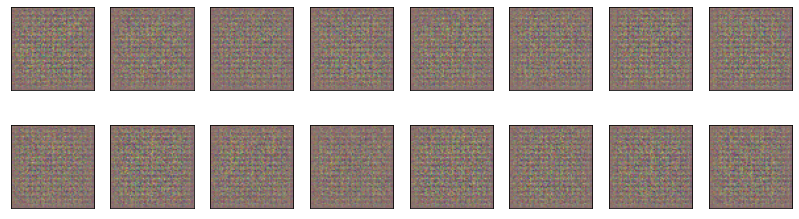

2022-12-29 10:49:37 | Epoch [2/50] | Batch 0/573 | d_loss: 0.3260 | g_loss: 10.5824
2022-12-29 10:49:58 | Epoch [2/50] | Batch 50/573 | d_loss: 0.3258 | g_loss: 10.4890
2022-12-29 10:50:18 | Epoch [2/50] | Batch 100/573 | d_loss: 0.3259 | g_loss: 10.6726
2022-12-29 10:50:38 | Epoch [2/50] | Batch 150/573 | d_loss: 0.3262 | g_loss: 10.9324
2022-12-29 10:50:59 | Epoch [2/50] | Batch 200/573 | d_loss: 0.3269 | g_loss: 10.6670
2022-12-29 10:51:19 | Epoch [2/50] | Batch 250/573 | d_loss: 0.3263 | g_loss: 11.0319
2022-12-29 10:51:40 | Epoch [2/50] | Batch 300/573 | d_loss: 0.3258 | g_loss: 10.9287
2022-12-29 10:52:00 | Epoch [2/50] | Batch 350/573 | d_loss: 0.3281 | g_loss: 11.1194
2022-12-29 10:52:20 | Epoch [2/50] | Batch 400/573 | d_loss: 0.3259 | g_loss: 11.1291
2022-12-29 10:52:41 | Epoch [2/50] | Batch 450/573 | d_loss: 0.3273 | g_loss: 11.3756
2022-12-29 10:53:01 | Epoch [2/50] | Batch 500/573 | d_loss: 0.3255 | g_loss: 11.1851
2022-12-29 10:53:22 | Epoch [2/50] | Batch 550/573 | d_lo

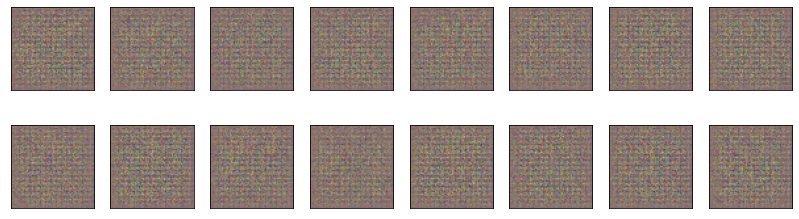

2022-12-29 10:53:32 | Epoch [3/50] | Batch 0/573 | d_loss: 0.3274 | g_loss: 11.1890
2022-12-29 10:53:53 | Epoch [3/50] | Batch 50/573 | d_loss: 0.3257 | g_loss: 11.5550
2022-12-29 10:54:13 | Epoch [3/50] | Batch 100/573 | d_loss: 0.3260 | g_loss: 11.4864
2022-12-29 10:54:34 | Epoch [3/50] | Batch 150/573 | d_loss: 0.3268 | g_loss: 11.5014
2022-12-29 10:54:54 | Epoch [3/50] | Batch 200/573 | d_loss: 0.3257 | g_loss: 11.5940
2022-12-29 10:55:14 | Epoch [3/50] | Batch 250/573 | d_loss: 0.3256 | g_loss: 11.5853
2022-12-29 10:55:35 | Epoch [3/50] | Batch 300/573 | d_loss: 0.3261 | g_loss: 11.4965
2022-12-29 10:55:55 | Epoch [3/50] | Batch 350/573 | d_loss: 0.3260 | g_loss: 11.9919
2022-12-29 10:56:16 | Epoch [3/50] | Batch 400/573 | d_loss: 0.3264 | g_loss: 11.7459
2022-12-29 10:56:36 | Epoch [3/50] | Batch 450/573 | d_loss: 0.3332 | g_loss: 11.9227
2022-12-29 10:56:57 | Epoch [3/50] | Batch 500/573 | d_loss: 0.3255 | g_loss: 11.8331
2022-12-29 10:57:17 | Epoch [3/50] | Batch 550/573 | d_lo

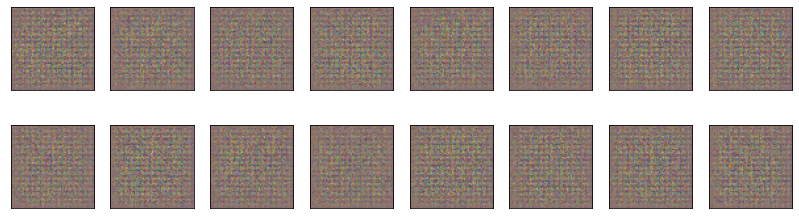

2022-12-29 10:57:28 | Epoch [4/50] | Batch 0/573 | d_loss: 0.3255 | g_loss: 11.8242
2022-12-29 10:57:48 | Epoch [4/50] | Batch 50/573 | d_loss: 0.3257 | g_loss: 11.9885
2022-12-29 10:58:09 | Epoch [4/50] | Batch 100/573 | d_loss: 0.3259 | g_loss: 11.9963
2022-12-29 10:58:29 | Epoch [4/50] | Batch 150/573 | d_loss: 0.3265 | g_loss: 11.8644
2022-12-29 10:58:49 | Epoch [4/50] | Batch 200/573 | d_loss: 0.3262 | g_loss: 12.0623
2022-12-29 10:59:10 | Epoch [4/50] | Batch 250/573 | d_loss: 0.3258 | g_loss: 11.9067
2022-12-29 10:59:30 | Epoch [4/50] | Batch 300/573 | d_loss: 0.3258 | g_loss: 12.2166
2022-12-29 10:59:51 | Epoch [4/50] | Batch 350/573 | d_loss: 0.3260 | g_loss: 12.1184
2022-12-29 11:00:11 | Epoch [4/50] | Batch 400/573 | d_loss: 0.3278 | g_loss: 11.9301
2022-12-29 11:00:32 | Epoch [4/50] | Batch 450/573 | d_loss: 0.3256 | g_loss: 11.8609
2022-12-29 11:00:52 | Epoch [4/50] | Batch 500/573 | d_loss: 0.3255 | g_loss: 11.9836
2022-12-29 11:01:12 | Epoch [4/50] | Batch 550/573 | d_lo

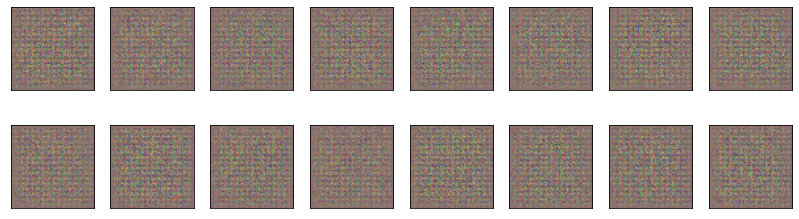

2022-12-29 11:01:23 | Epoch [5/50] | Batch 0/573 | d_loss: 0.3255 | g_loss: 12.1061
2022-12-29 11:01:44 | Epoch [5/50] | Batch 50/573 | d_loss: 0.3256 | g_loss: 12.0421
2022-12-29 11:02:04 | Epoch [5/50] | Batch 100/573 | d_loss: 0.3278 | g_loss: 12.2974
2022-12-29 11:02:24 | Epoch [5/50] | Batch 150/573 | d_loss: 0.3265 | g_loss: 12.2070
2022-12-29 11:02:45 | Epoch [5/50] | Batch 200/573 | d_loss: 0.3259 | g_loss: 12.1391
2022-12-29 11:03:05 | Epoch [5/50] | Batch 250/573 | d_loss: 0.3267 | g_loss: 12.3462
2022-12-29 11:03:26 | Epoch [5/50] | Batch 300/573 | d_loss: 0.3258 | g_loss: 12.5424
2022-12-29 11:03:46 | Epoch [5/50] | Batch 350/573 | d_loss: 0.3258 | g_loss: 12.1350
2022-12-29 11:04:07 | Epoch [5/50] | Batch 400/573 | d_loss: 0.3261 | g_loss: 12.2530
2022-12-29 11:04:27 | Epoch [5/50] | Batch 450/573 | d_loss: 0.3295 | g_loss: 12.3849
2022-12-29 11:04:47 | Epoch [5/50] | Batch 500/573 | d_loss: 0.3254 | g_loss: 12.3785
2022-12-29 11:05:08 | Epoch [5/50] | Batch 550/573 | d_lo

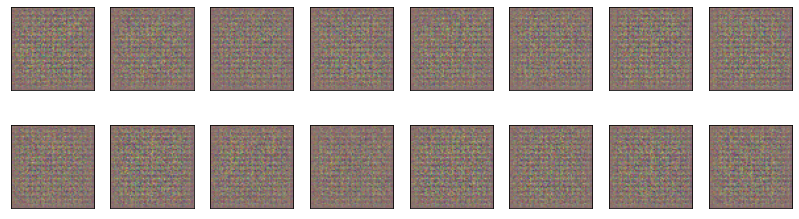

2022-12-29 11:05:19 | Epoch [6/50] | Batch 0/573 | d_loss: 0.3262 | g_loss: 12.4460
2022-12-29 11:05:39 | Epoch [6/50] | Batch 50/573 | d_loss: 0.3256 | g_loss: 12.4243
2022-12-29 11:06:00 | Epoch [6/50] | Batch 100/573 | d_loss: 0.3289 | g_loss: 12.5026
2022-12-29 11:06:20 | Epoch [6/50] | Batch 150/573 | d_loss: 0.3259 | g_loss: 12.5235
2022-12-29 11:06:40 | Epoch [6/50] | Batch 200/573 | d_loss: 0.3275 | g_loss: 12.3900
2022-12-29 11:07:01 | Epoch [6/50] | Batch 250/573 | d_loss: 0.3252 | g_loss: 12.4837
2022-12-29 11:07:21 | Epoch [6/50] | Batch 300/573 | d_loss: 0.3256 | g_loss: 12.4133
2022-12-29 11:07:42 | Epoch [6/50] | Batch 350/573 | d_loss: 0.3259 | g_loss: 12.3798
2022-12-29 11:08:02 | Epoch [6/50] | Batch 400/573 | d_loss: 0.3258 | g_loss: 12.8225
2022-12-29 11:08:23 | Epoch [6/50] | Batch 450/573 | d_loss: 0.3258 | g_loss: 12.7702
2022-12-29 11:08:43 | Epoch [6/50] | Batch 500/573 | d_loss: 0.3260 | g_loss: 12.5956
2022-12-29 11:09:04 | Epoch [6/50] | Batch 550/573 | d_lo

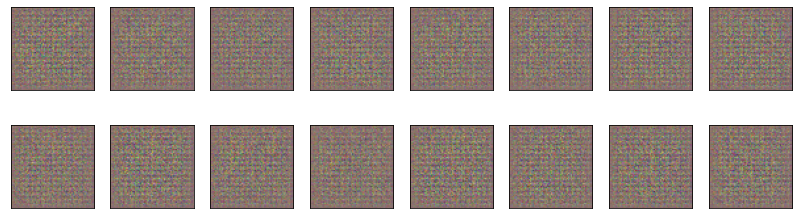

2022-12-29 11:09:14 | Epoch [7/50] | Batch 0/573 | d_loss: 0.3254 | g_loss: 12.5277
2022-12-29 11:09:35 | Epoch [7/50] | Batch 50/573 | d_loss: 0.3256 | g_loss: 12.5565
2022-12-29 11:09:55 | Epoch [7/50] | Batch 100/573 | d_loss: 0.3254 | g_loss: 12.5705
2022-12-29 11:10:16 | Epoch [7/50] | Batch 150/573 | d_loss: 0.3259 | g_loss: 12.6033
2022-12-29 11:10:36 | Epoch [7/50] | Batch 200/573 | d_loss: 0.3255 | g_loss: 12.6284
2022-12-29 11:10:56 | Epoch [7/50] | Batch 250/573 | d_loss: 0.3259 | g_loss: 12.7518
2022-12-29 11:11:17 | Epoch [7/50] | Batch 300/573 | d_loss: 0.3262 | g_loss: 12.6918
2022-12-29 11:11:37 | Epoch [7/50] | Batch 350/573 | d_loss: 0.3257 | g_loss: 12.7659
2022-12-29 11:11:58 | Epoch [7/50] | Batch 400/573 | d_loss: 0.3272 | g_loss: 12.8395
2022-12-29 11:12:18 | Epoch [7/50] | Batch 450/573 | d_loss: 0.3256 | g_loss: 12.7954
2022-12-29 11:12:38 | Epoch [7/50] | Batch 500/573 | d_loss: 0.3278 | g_loss: 12.7529
2022-12-29 11:12:59 | Epoch [7/50] | Batch 550/573 | d_lo

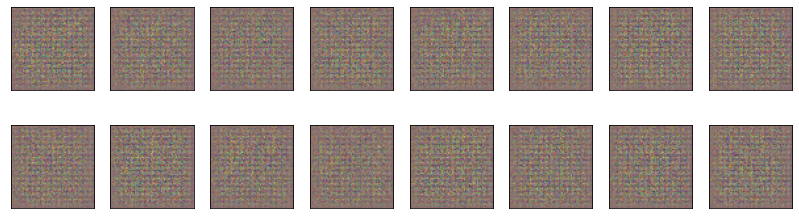

2022-12-29 11:13:09 | Epoch [8/50] | Batch 0/573 | d_loss: 0.3262 | g_loss: 12.9137
2022-12-29 11:13:30 | Epoch [8/50] | Batch 50/573 | d_loss: 0.3266 | g_loss: 12.9819
2022-12-29 11:13:50 | Epoch [8/50] | Batch 100/573 | d_loss: 0.3263 | g_loss: 12.9520
2022-12-29 11:14:11 | Epoch [8/50] | Batch 150/573 | d_loss: 0.3253 | g_loss: 12.8655
2022-12-29 11:14:31 | Epoch [8/50] | Batch 200/573 | d_loss: 0.3283 | g_loss: 12.7762
2022-12-29 11:14:51 | Epoch [8/50] | Batch 250/573 | d_loss: 0.3260 | g_loss: 12.7700
2022-12-29 11:15:12 | Epoch [8/50] | Batch 300/573 | d_loss: 0.3261 | g_loss: 12.9513
2022-12-29 11:15:32 | Epoch [8/50] | Batch 350/573 | d_loss: 0.3260 | g_loss: 12.8429
2022-12-29 11:15:52 | Epoch [8/50] | Batch 400/573 | d_loss: 0.3261 | g_loss: 12.9749
2022-12-29 11:16:13 | Epoch [8/50] | Batch 450/573 | d_loss: 0.3263 | g_loss: 13.2411
2022-12-29 11:16:33 | Epoch [8/50] | Batch 500/573 | d_loss: 0.3263 | g_loss: 13.0790
2022-12-29 11:16:53 | Epoch [8/50] | Batch 550/573 | d_lo

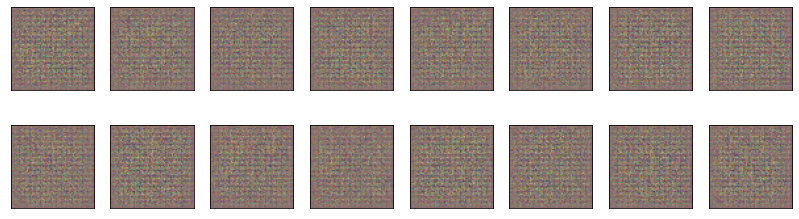

2022-12-29 11:17:04 | Epoch [9/50] | Batch 0/573 | d_loss: 0.3255 | g_loss: 13.1261
2022-12-29 11:17:24 | Epoch [9/50] | Batch 50/573 | d_loss: 0.3273 | g_loss: 13.3650
2022-12-29 11:17:45 | Epoch [9/50] | Batch 100/573 | d_loss: 0.3269 | g_loss: 13.1674
2022-12-29 11:18:05 | Epoch [9/50] | Batch 150/573 | d_loss: 0.3252 | g_loss: 12.9718
2022-12-29 11:18:25 | Epoch [9/50] | Batch 200/573 | d_loss: 0.3259 | g_loss: 13.2405
2022-12-29 11:18:46 | Epoch [9/50] | Batch 250/573 | d_loss: 0.3255 | g_loss: 13.0815
2022-12-29 11:19:06 | Epoch [9/50] | Batch 300/573 | d_loss: 0.3255 | g_loss: 13.2906
2022-12-29 11:19:26 | Epoch [9/50] | Batch 350/573 | d_loss: 0.3263 | g_loss: 13.0282
2022-12-29 11:19:47 | Epoch [9/50] | Batch 400/573 | d_loss: 0.3257 | g_loss: 13.1669
2022-12-29 11:20:07 | Epoch [9/50] | Batch 450/573 | d_loss: 0.3258 | g_loss: 13.1663
2022-12-29 11:20:28 | Epoch [9/50] | Batch 500/573 | d_loss: 0.3255 | g_loss: 13.2684
2022-12-29 11:20:48 | Epoch [9/50] | Batch 550/573 | d_lo

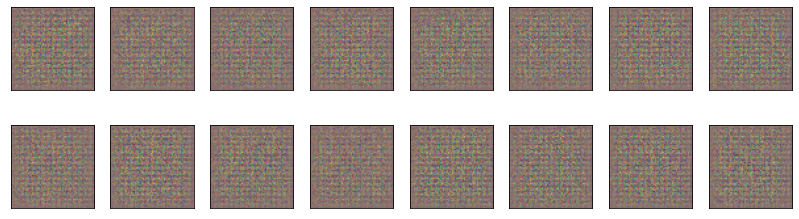

2022-12-29 11:20:58 | Epoch [10/50] | Batch 0/573 | d_loss: 0.3265 | g_loss: 13.0741
2022-12-29 11:21:19 | Epoch [10/50] | Batch 50/573 | d_loss: 0.3259 | g_loss: 13.1864
2022-12-29 11:21:39 | Epoch [10/50] | Batch 100/573 | d_loss: 0.3253 | g_loss: 13.2259
2022-12-29 11:22:00 | Epoch [10/50] | Batch 150/573 | d_loss: 0.3256 | g_loss: 13.1926
2022-12-29 11:22:20 | Epoch [10/50] | Batch 200/573 | d_loss: 0.3263 | g_loss: 13.3014
2022-12-29 11:22:40 | Epoch [10/50] | Batch 250/573 | d_loss: 0.3256 | g_loss: 13.2609
2022-12-29 11:23:01 | Epoch [10/50] | Batch 300/573 | d_loss: 0.3271 | g_loss: 13.3204
2022-12-29 11:23:21 | Epoch [10/50] | Batch 350/573 | d_loss: 0.3259 | g_loss: 13.3219
2022-12-29 11:23:41 | Epoch [10/50] | Batch 400/573 | d_loss: 0.3259 | g_loss: 13.1319
2022-12-29 11:24:02 | Epoch [10/50] | Batch 450/573 | d_loss: 0.3266 | g_loss: 13.1533
2022-12-29 11:24:22 | Epoch [10/50] | Batch 500/573 | d_loss: 0.3258 | g_loss: 13.4759
2022-12-29 11:24:42 | Epoch [10/50] | Batch 55

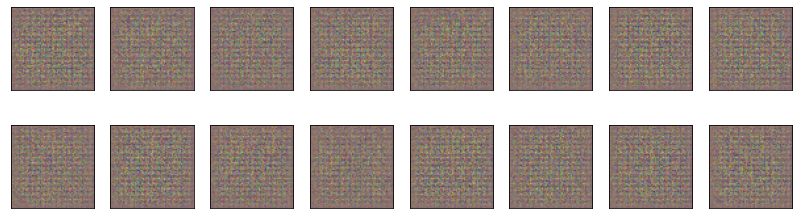

2022-12-29 11:24:53 | Epoch [11/50] | Batch 0/573 | d_loss: 0.3254 | g_loss: 13.4853
2022-12-29 11:25:13 | Epoch [11/50] | Batch 50/573 | d_loss: 0.3257 | g_loss: 13.1632
2022-12-29 11:25:34 | Epoch [11/50] | Batch 100/573 | d_loss: 0.3275 | g_loss: 13.5000
2022-12-29 11:25:54 | Epoch [11/50] | Batch 150/573 | d_loss: 0.3255 | g_loss: 13.3395
2022-12-29 11:26:14 | Epoch [11/50] | Batch 200/573 | d_loss: 0.3254 | g_loss: 13.3100
2022-12-29 11:26:35 | Epoch [11/50] | Batch 250/573 | d_loss: 0.3254 | g_loss: 13.4630
2022-12-29 11:26:55 | Epoch [11/50] | Batch 300/573 | d_loss: 0.3253 | g_loss: 13.5478
2022-12-29 11:27:15 | Epoch [11/50] | Batch 350/573 | d_loss: 0.3265 | g_loss: 13.6329
2022-12-29 11:27:36 | Epoch [11/50] | Batch 400/573 | d_loss: 0.3254 | g_loss: 13.6352
2022-12-29 11:27:56 | Epoch [11/50] | Batch 450/573 | d_loss: 0.3258 | g_loss: 13.5912
2022-12-29 11:28:17 | Epoch [11/50] | Batch 500/573 | d_loss: 0.3287 | g_loss: 13.6711
2022-12-29 11:28:37 | Epoch [11/50] | Batch 55

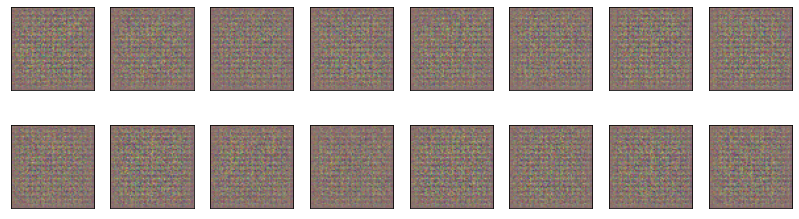

2022-12-29 11:28:47 | Epoch [12/50] | Batch 0/573 | d_loss: 0.3255 | g_loss: 13.4388
2022-12-29 11:29:08 | Epoch [12/50] | Batch 50/573 | d_loss: 0.3256 | g_loss: 13.5808
2022-12-29 11:29:28 | Epoch [12/50] | Batch 100/573 | d_loss: 0.3256 | g_loss: 13.5190
2022-12-29 11:29:48 | Epoch [12/50] | Batch 150/573 | d_loss: 0.3256 | g_loss: 13.7615
2022-12-29 11:30:09 | Epoch [12/50] | Batch 200/573 | d_loss: 0.3258 | g_loss: 13.5026
2022-12-29 11:30:29 | Epoch [12/50] | Batch 250/573 | d_loss: 0.3275 | g_loss: 13.4804
2022-12-29 11:30:49 | Epoch [12/50] | Batch 300/573 | d_loss: 0.3255 | g_loss: 13.6966
2022-12-29 11:31:10 | Epoch [12/50] | Batch 350/573 | d_loss: 0.3264 | g_loss: 13.5798
2022-12-29 11:31:30 | Epoch [12/50] | Batch 400/573 | d_loss: 0.3259 | g_loss: 13.5536
2022-12-29 11:31:51 | Epoch [12/50] | Batch 450/573 | d_loss: 0.3261 | g_loss: 13.7648
2022-12-29 11:32:11 | Epoch [12/50] | Batch 500/573 | d_loss: 0.3260 | g_loss: 13.6835
2022-12-29 11:32:31 | Epoch [12/50] | Batch 55

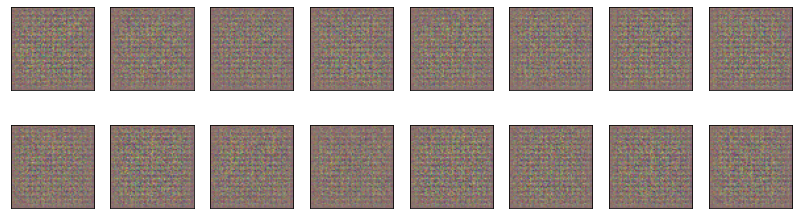

2022-12-29 11:32:42 | Epoch [13/50] | Batch 0/573 | d_loss: 0.3259 | g_loss: 13.6887
2022-12-29 11:33:02 | Epoch [13/50] | Batch 50/573 | d_loss: 0.3268 | g_loss: 13.9861


KeyboardInterrupt: 

In [256]:
#fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)

losses = []
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)
for epoch in range(n_epochs):
   
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
       
        #for k in range(2):
        d_optimizer.zero_grad()
        z = np.random.uniform(-1,1, size = (batch_size, latent_dim, 1, 1))
        z = torch.from_numpy(z).float()
        z = z.to(device)
        
        fake_images = generator(z)
        
        output_discriminator_fake_image = discriminator(fake_images)
        output_discriminator_real_image = discriminator(real_images)
        
        
        
        #d_loss = discriminator_loss(discriminator.logits_wasserstein(real_images),discriminator.logits_wasserstein(fake_images))+ gradient_penalty(discriminator, real_images, fake_images)
        d_loss = discriminator_loss(output_discriminator_real_image, output_discriminator_fake_image)
        d_loss.backward()
       
        d_optimizer.step()
        
        # train generator
       
            
        g_optimizer.zero_grad()
        z = np.random.uniform(-1,1, size = (batch_size, latent_dim, 1, 1))
        z = torch.from_numpy(z).float()
        z = z.to(device)
        
        fake_images = generator(z)
        
        #D_fake = discriminator.logits_wasserstein(fake_images)#.detach()#.view(-1)
        D_fake = discriminator(fake_images.detach()).view(-1)  
        
        g_loss = generator_loss(D_fake)
       
        g_loss.backward()
        g_optimizer.step()
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            
         
            
            d = d_loss.item()
            g = g_loss.item()
            
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    

    
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

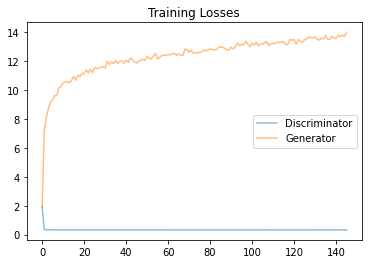

In [257]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.